In [18]:
import matplotlib.pyplot as plt
plt.rcParams['figure.dpi'] = 300

import matplotlib.dates as mdates
import pandas as pd
import numpy as np
# ds083  GFS    NAM
# 1deg   0.5deg  12km
# https://www.ncdc.noaa.gov/data-access/model-data/model-datasets/north-american-mesoscale-forecast-system-nam
# https://www.ncdc.noaa.gov/data-access/model-data/model-datasets/global-forcast-system-gfs

In [2]:
from netCDF4 import Dataset
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import wrf
from wrf import getvar, vinterp, ALL_TIMES, destagger, to_np, interplevel

In [3]:
expruns = ['20120816_d03_gfs05_p1r1', '20120816_d03_gfs05_p1r3','20120816_d03_gfs05_p1r5',
           '20120816_d03_gfs05_p2r1', '20120816_d03_gfs05_p2r3','20120816_d03_gfs05_p2r5',
           '20120816_d03_nam32_p1r1', '20120816_d03_nam32_p1r3','20120816_d03_nam32_p1r5',
           '20120816_d03_nam32_p2r1', '20120816_d03_nam32_p2r3','20120816_d03_nam32_p2r5',
           ]
expnames = ['g1r1', 'g1r3', 'g1r5', 'g2r1', 'g2r3', 'g2r5', 
            'n1r1', 'n1r3', 'n1r5', 'n2r1', 'n2r3', 'n2r5']
expruns[1]

'20120816_d03_gfs05_p1r3'

In [4]:
#ls interp30\

In [5]:
# READ WRF INTERP DATA
ids = [0,1,2,7,12,17,22,27,32,37,42,47]
t1, t2, t3, t4 = '2012-08-16 12:00', '2012-08-17 12:00', '2012-08-18 12:00', '2012-08-19 12:00'
zlevels=['30','40','50','100','150','200','250','300','350','400','450','500']
wrf = xr.open_dataset('interp30/sodar_g1r1.nc')['uv30']
wrf1 = xr.open_dataset('interp30/sodar_g1r1.nc')['uv30'].values
wrf2 = xr.open_dataset('interp30/sodar_g1r3.nc')['uv30'].values
wrf3 = xr.open_dataset('interp30/sodar_g1r5.nc')['uv30'].values
wrf4 = xr.open_dataset('interp30/sodar_g2r1.nc')['uv30'].values
wrf5 = xr.open_dataset('interp30/sodar_g2r3.nc')['uv30'].values
wrf6 = xr.open_dataset('interp30/sodar_g2r5.nc')['uv30'].values
wrf7 = xr.open_dataset('interp30/sodar_n1r1.nc')['uv30'].values
wrf8 = xr.open_dataset('interp30/sodar_n1r3.nc')['uv30'].values
wrf9 = xr.open_dataset('interp30/sodar_n1r5.nc')['uv30'].values
wrf10= xr.open_dataset('interp30/sodar_n2r1.nc')['uv30'].values
wrf11= xr.open_dataset('interp30/sodar_n2r3.nc')['uv30'].values
wrf12= xr.open_dataset('interp30/sodar_n2r5.nc')['uv30'].values

drw1 = xr.open_dataset('interp30/sodar_g1r1.nc')['wd30'].values
drw2 = xr.open_dataset('interp30/sodar_g1r3.nc')['wd30'].values
drw3 = xr.open_dataset('interp30/sodar_g1r5.nc')['wd30'].values
drw4 = xr.open_dataset('interp30/sodar_g2r1.nc')['wd30'].values
drw5 = xr.open_dataset('interp30/sodar_g2r3.nc')['wd30'].values
drw6 = xr.open_dataset('interp30/sodar_g1r5.nc')['wd30'].values
drw7 = xr.open_dataset('interp30/sodar_n1r1.nc')['wd30'].values
drw8 = xr.open_dataset('interp30/sodar_n1r3.nc')['wd30'].values

tv1 = xr.open_dataset('interp30/sodar_g1r1.nc')['tv30'].values
tv2 = xr.open_dataset('interp30/sodar_g1r3.nc')['tv30'].values
tv3 = xr.open_dataset('interp30/sodar_g1r5.nc')['tv30'].values
tv4 = xr.open_dataset('interp30/sodar_g2r1.nc')['tv30'].values
tv5 = xr.open_dataset('interp30/sodar_g2r3.nc')['tv30'].values
tv6 = xr.open_dataset('interp30/sodar_g1r5.nc')['tv30'].values
tv7 = xr.open_dataset('interp30/sodar_n1r1.nc')['tv30'].values
tv8 = xr.open_dataset('interp30/sodar_n1r3.nc')['tv30'].values
tv9 = xr.open_dataset('interp30/sodar_n1r5.nc')['tv30'].values
tv10= xr.open_dataset('interp30/sodar_n2r1.nc')['tv30'].values
tv11= xr.open_dataset('interp30/sodar_n2r3.nc')['tv30'].values
tv12= xr.open_dataset('interp30/sodar_n2r5.nc')['tv30'].values

sread_w =  pd.read_pickle('sodar_sp.pk')
sread_d =  pd.read_pickle('sodar_dd.pk')
sread_t =  pd.read_pickle('sodar_tv.pk')

sodarw =  sread_w.iloc[:,ids][t1:t4].interpolate().values
sodard =  sread_d.iloc[:,ids][t1:t4].interpolate().values
sodart =  sread_t.iloc[:,ids][t1:t4].interpolate().values

xt = sread_w.iloc[:,ids]['2012-08-16 12:30':'2012-08-19 12:00'].index
x1 = sread_w.iloc[:,ids]['2012-08-16 12:30':'2012-08-17 12:00'].index
x2 = sread_w.iloc[:,ids]['2012-08-17 12:30':'2012-08-18 12:00'].index
x3 = sread_w.iloc[:,ids]['2012-08-18 12:30':'2012-08-19 12:00'].index

sodarw1 = sread_w.iloc[:,ids]['2012-08-17 00:30':'2012-08-18 00:00'].interpolate().values
sodarw2 = sread_w.iloc[:,ids]['2012-08-18 00:30':'2012-08-19 00:00'].interpolate().values
sodarw3 = sread_w.iloc[:,ids]['2012-08-18 12:30':'2012-08-19 12:00'].interpolate().values
sodart1 = sread_t.iloc[:,ids]['2012-08-17 00:30':'2012-08-18 00:00'].interpolate().values
sodart2 = sread_t.iloc[:,ids]['2012-08-18 00:30':'2012-08-19 00:00'].interpolate().values
sodart3 = sread_t.iloc[:,ids]['2012-08-18 12:30':'2012-08-19 12:00'].interpolate().values

In [6]:
#xr.open_dataset('interp30/sodar_g1r1.nc')['tv30']
wrf

<xarray.DataArray 'uv30' (Time: 145, interp_level: 12)>
array([[1.976057, 1.998431, 2.020774, ..., 1.547575, 1.43124 , 1.318264],
       [3.829608, 3.913747, 3.997773, ..., 3.944606, 3.841184, 3.729788],
       [5.628348, 5.772418, 5.916296, ..., 5.880783, 5.711979, 5.531928],
       ...,
       [2.035292, 2.063964, 2.092597, ..., 1.921552, 1.910267, 1.926955],
       [3.188793, 3.248305, 3.307739, ..., 2.996796, 2.881765, 2.765723],
       [3.256968, 3.32536 , 3.393661, ..., 3.270134, 3.175171, 3.076385]],
      dtype=float32)
Coordinates:
  * Time          (Time) datetime64[ns] 2012-08-16T12:00:00 ... 2012-08-19T12...
  * interp_level  (interp_level) float64 0.03 0.04 0.05 0.1 ... 0.4 0.45 0.5

In [24]:
from matplotlib.patches import Rectangle

def panelPlot(t1, t2, t3, t4):
    fig, axs = plt.subplots(2, 2, figsize=(12,10))
    fig.subplots_adjust(left=0.08, right=0.98, wspace=0.1, hspace=0.2)
    for axl in range(0,2):
        for axc in range(0,2):

            plt.setp( axs[axl,axc].xaxis.get_majorticklabels(), rotation=25 )
            axs[axl,axc].grid()
            axs[0,0].set_ylabel('Wind Speed ms-1')
            axs[1,0].set_ylabel('Wind Speed ms-1')
            myFmt = mdates.DateFormatter('%d Aug %Hh')
            axs[axl,axc].xaxis.set_major_formatter(myFmt)
            
    lw = 0.6
    ax = axs[0, 0]
    ax.set_ylim([tt1, tt2])
    ax.plot(xt[t1:t2], sodarw[t1:t2,2], label='Sodar '+zlevels[2]+'m')
    ax.plot(xt[t1:t2], sodarw[t1:t2,3], label='Sodar '+zlevels[3]+'m')
    ax.plot(xt[t1:t2], sodarw[t1:t2,5], label='Sodar '+zlevels[5]+'m')
    ax.plot(xt[t1:t2], sodarw[t1:t2,7], label='Sodar '+zlevels[7]+'m')
    #xtics = np.arange(ax.get_xticks()[0], ax.get_xticks()[8], (ax.get_xticks()[8] - ax.get_xticks()[0])/48)
    #ax.add_patch(Rectangle((xtics[1], 1),1/4,11,linewidth=1,edgecolor='r',facecolor='none'))
    ax.legend();

    ax = axs[0, 1]
    ax.set_ylim([tt1, tt2])
    ax.plot(xt[t3:t4], sodarw[t3:t4,2], label='Sodar '+zlevels[2]+'m')
    ax.plot(xt[t3:t4], sodarw[t3:t4,3], label='Sodar '+zlevels[3]+'m')
    ax.plot(xt[t3:t4], sodarw[t3:t4,5], label='Sodar '+zlevels[5]+'m')
    ax.plot(xt[t3:t4], sodarw[t3:t4,7], label='Sodar '+zlevels[7]+'m')
    ax.legend();

    ax = axs[1, 0]
    ax.set_ylim([tt1, tt2])
    ax.plot(xt[t1:t2], sodarw[t1:t2,2], label='Sodar '+zlevels[2]+'m')
    ax.plot(xt[t1:t2], sodarw[t1:t2,3], label='Sodar '+zlevels[3]+'m')
    ax.plot(xt[t1:t2], sodarw[t1:t2,5], label='Sodar '+zlevels[5]+'m')
    ax.legend();

    ax = axs[1, 1]
    ax.set_ylim([tt1, tt2])
    ax.plot(xt[t3:t4], sodarw[t3:t4,2], label='Sodar '+zlevels[2]+'m')
    ax.plot(xt[t3:t4], sodarw[t3:t4,3], label='Sodar '+zlevels[3]+'m')
    ax.plot(xt[t3:t4], sodarw[t3:t4,5], label='Sodar '+zlevels[5]+'m')
    ax.legend();

    plt.title('SODAR OBS Wind Speed AGL', x=0.0, y=2.25)
    

    #print(level, skey, wkey)
    #plt.savefig('figs/panelPlotd'+skey+'.png', dpi=300)

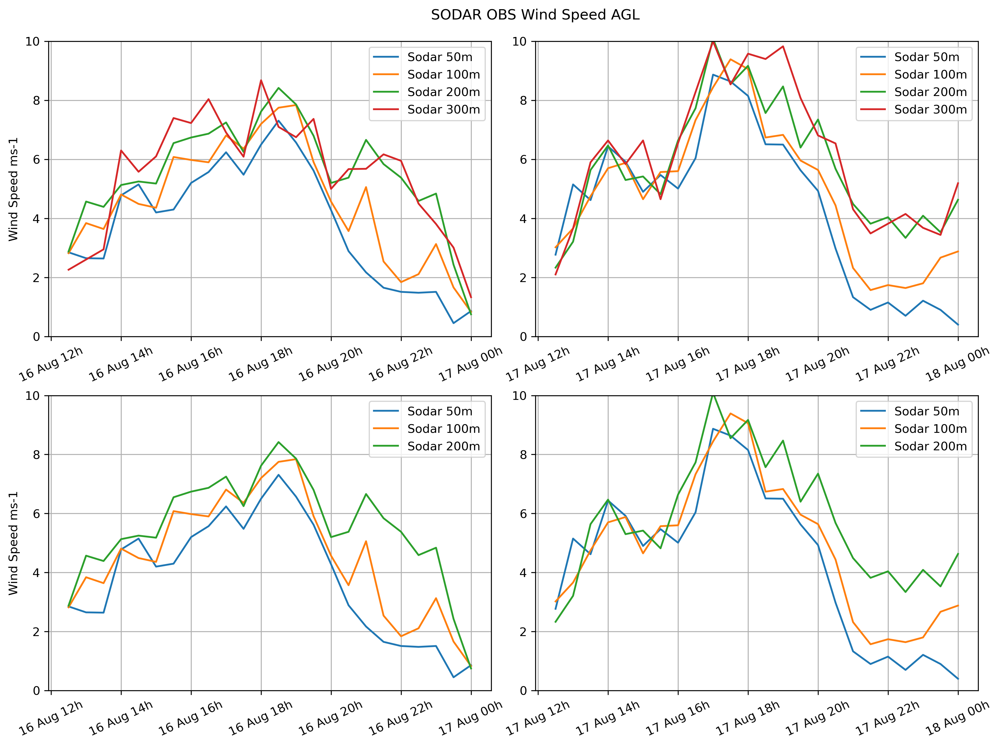

In [28]:
t1, t2, t3, t4 = 0, 24, 48, 72
tt1, tt2 = 0, 10
panelPlot(t1, t2, t3, t4)

In [27]:
def panelPlot2(level, t1, t2, t3, t4):
    fig, axs = plt.subplots(2, 2, figsize=(12,9))
    fig.subplots_adjust(left=0.08, right=0.98, wspace=0.1, hspace=0.2)
    for axl in range(0,2):
        for axc in range(0,2):

            plt.setp( axs[axl,axc].xaxis.get_majorticklabels(), rotation=25 )
            axs[axl,axc].grid()
            axs[0,0].set_ylabel('Velocidad de Viento')
            axs[1,0].set_ylabel('Velocidad de Viento')
            myFmt = mdates.DateFormatter('%d Ago %Hh')
            axs[axl,axc].xaxis.set_major_formatter(myFmt)
            
    lw = 0.6
    ax = axs[0, 0]
    ax.set_ylim([tt1, tt2])
    ax.plot(xt[t1:t2], sodarw[t1:t2,level], label='SODAR')
    ax.plot(xt[t1:t2], wrf1[t1:t2, level], label=expnames[0], linewidth=lw)
    ax.plot(xt[t1:t2], wrf2[t1:t2, level], label=expnames[1], linewidth=lw)
    ax.plot(xt[t1:t2], wrf3[t1:t2, level], label=expnames[2], linewidth=lw)
    ax.plot(xt[t1:t2], wrf4[t1:t2, level], label=expnames[3], linewidth=lw, linestyle='--')
    ax.plot(xt[t1:t2], wrf5[t1:t2, level], label=expnames[4], linewidth=lw, linestyle='--')
    ax.plot(xt[t1:t2], wrf6[t1:t2, level], label=expnames[5], linewidth=lw, linestyle='--')
    ax.legend();

    ax = axs[0, 1]
    ax.set_ylim([tt1, tt2])
    ax.plot(xt[t3:t4], sodarw[t3:t4,level], label='SODAR')
    ax.plot(xt[t3:t4], wrf1[t3:t4, level], label=expnames[0], linewidth=lw)
    ax.plot(xt[t3:t4], wrf2[t3:t4, level], label=expnames[1], linewidth=lw)
    ax.plot(xt[t3:t4], wrf3[t3:t4, level], label=expnames[2], linewidth=lw)
    ax.plot(xt[t3:t4], wrf4[t3:t4, level], label=expnames[3], linewidth=lw, linestyle='--')
    ax.plot(xt[t3:t4], wrf5[t3:t4, level], label=expnames[4], linewidth=lw, linestyle='--')
    ax.plot(xt[t3:t4], wrf6[t3:t4, level], label=expnames[5], linewidth=lw, linestyle='--')
    ax.legend();

    ax = axs[1, 0]
    ax.set_ylim([tt1, tt2])
    ax.plot(xt[t1:t2], sodarw[t1:t2,level], label='SODAR')
    ax.plot(xt[t1:t2], wrf7[t1:t2, level], label=expnames[6], linewidth=lw)
    ax.plot(xt[t1:t2], wrf8[t1:t2, level], label=expnames[7], linewidth=lw)
    ax.plot(xt[t1:t2], wrf9[t1:t2, level], label=expnames[8], linewidth=lw)
    ax.plot(xt[t1:t2], wrf10[t1:t2, level], label=expnames[9], linewidth=lw, linestyle='--')
    ax.plot(xt[t1:t2], wrf11[t1:t2, level], label=expnames[10], linewidth=lw, linestyle='--')
    ax.plot(xt[t1:t2], wrf12[t1:t2, level], label=expnames[11], linewidth=lw, linestyle='--')
    ax.legend();

    ax = axs[1, 1]
    ax.set_ylim([tt1, tt2])
    ax.plot(xt[t3:t4], sodarw[t3:t4,level], label='SODAR')
    ax.plot(xt[t3:t4],    wrf7[t3:t4, level], label=expnames[6], linewidth=lw)
    ax.plot(xt[t3:t4],    wrf8[t3:t4, level], label=expnames[7], linewidth=lw)
    ax.plot(xt[t3:t4],    wrf9[t3:t4, level], label=expnames[8], linewidth=lw)
    ax.plot(xt[t3:t4],   wrf10[t3:t4, level], label=expnames[9], linewidth=lw , linestyle='--')
    ax.plot(xt[t3:t4],   wrf11[t3:t4, level], label=expnames[10], linewidth=lw, linestyle='--')
    ax.plot(xt[t3:t4],   wrf12[t3:t4, level], label=expnames[11], linewidth=lw, linestyle='--')
    ax.legend();

    plt.title('Viento SODAR & WRF en nivel '+zlevels[level]+'m', x=0.0, y=2.25)


    #print(level, skey, wkey)
    #plt.savefig('figs/panelPlotd'+skey+'.png', dpi=300)

In [10]:
def panelPlot2t(level, t1, t2, t3, t4):
    #skey = sodart1.keys()[level*1000]
    #wkey = tv1.interp_level.values*1000
    fig, axs = plt.subplots(2, 2, figsize=(12,9))
    fig.subplots_adjust(left=0.08, right=0.98, wspace=0.1, hspace=0.2)
    for axl in range(0,2):
        for axc in range(0,2):
            plt.setp( axs[axl,axc].xaxis.get_majorticklabels(), rotation=25 )
            axs[axl,axc].grid()
            axs[0,0].set_ylabel('Temperatura Virtual')
            axs[1,0].set_ylabel('Temperatura Virtual')
            myFmt = mdates.DateFormatter('%d Ago %Hh')
            axs[axl,axc].xaxis.set_major_formatter(myFmt)
            
    lw = 0.6
    ax = axs[0, 0]
    ax.set_ylim([tt1, tt2])
    ax.plot(xt[t1:t2], sodart[t1:t2,level], label='SODAR')
    ax.plot(xt[t1:t2], tv1[t1:t2, level], label=expnames[0], linewidth=lw)
    ax.plot(xt[t1:t2], tv2[t1:t2, level], label=expnames[1], linewidth=lw)
    ax.plot(xt[t1:t2], tv3[t1:t2, level], label=expnames[2], linewidth=lw)
    ax.plot(xt[t1:t2], tv4[t1:t2, level], label=expnames[3], linewidth=lw)
    ax.plot(xt[t1:t2], tv5[t1:t2, level], label=expnames[4], linewidth=lw)
    ax.plot(xt[t1:t2], tv6[t1:t2, level], label=expnames[5], linewidth=lw)
    ax.legend();

    ax = axs[0, 1]
    ax.set_ylim([tt1, tt2])
    ax.plot(xt[t3:t4], sodart[t3:t4,level], label='SODAR')
    ax.plot(xt[t3:t4], tv1[t3:t4, level], label=expnames[0], linewidth=lw)
    ax.plot(xt[t3:t4], tv2[t3:t4, level], label=expnames[1], linewidth=lw)
    ax.plot(xt[t3:t4], tv3[t3:t4, level], label=expnames[2], linewidth=lw)
    ax.plot(xt[t3:t4], tv4[t3:t4, level], label=expnames[3], linewidth=lw)
    ax.plot(xt[t3:t4], tv5[t3:t4, level], label=expnames[4], linewidth=lw)
    ax.plot(xt[t3:t4], tv6[t3:t4, level], label=expnames[5], linewidth=lw)
    ax.legend();

    ax = axs[1, 0]
    ax.set_ylim([tt1, tt2])
    ax.plot(xt[t1:t2], sodart[t1:t2,level], label='SODAR')
    ax.plot(xt[t1:t2], tv7[t1:t2, level], label=expnames[6], linewidth=lw)
    ax.plot(xt[t1:t2], tv8[t1:t2, level], label=expnames[7], linewidth=lw)
    ax.plot(xt[t1:t2], tv9[t1:t2, level], label=expnames[8], linewidth=lw)
    ax.plot(xt[t1:t2], tv10[t1:t2, level], label=expnames[9], linewidth=lw)
    ax.plot(xt[t1:t2], tv11[t1:t2, level], label=expnames[10], linewidth=lw)
    ax.plot(xt[t1:t2], tv12[t1:t2, level], label=expnames[11], linewidth=lw)
    ax.legend();

    ax = axs[1, 1]
    ax.set_ylim([tt1, tt2])
    ax.plot(xt[t3:t4], sodart[t3:t4,level], label='SODAR')
    ax.plot(xt[t3:t4],    tv7[t3:t4, level], label=expnames[6], linewidth=lw)
    ax.plot(xt[t3:t4],    tv8[t3:t4, level], label=expnames[7], linewidth=lw)
    ax.plot(xt[t3:t4],    tv9[t3:t4, level], label=expnames[8], linewidth=lw)
    ax.plot(xt[t3:t4],   tv10[t3:t4, level], label=expnames[9], linewidth=lw)
    ax.plot(xt[t3:t4],   tv11[t3:t4, level], label=expnames[10], linewidth=lw)
    ax.plot(xt[t3:t4],   tv12[t3:t4, level], label=expnames[11], linewidth=lw)
    ax.legend();

    plt.title('TV SODAR & experimentos en nivel '+zlevels[level]+'m', x=0.0, y=2.25)


    #print(level, skey, wkey)
    #plt.savefig('figs/panelPlotd'+skey+'.png', dpi=300)

In [11]:
def panelPlot3(level, t1, t2, t3, t4):
    #skey = sodarw1.keys()[level*1000]
    #wkey = wrf1.interp_level.values*1000
    fig, axs = plt.subplots(2, 3, figsize=(14,9))
    fig.subplots_adjust(left=0.08, right=0.98, wspace=0.15, hspace=0.3)
    for axl in range(0,2):
        for axc in range(0,3):
            plt.setp( axs[axl,axc].xaxis.get_majorticklabels(), rotation=25 )
            axs[0,0].set_ylabel('Sodar Viento')
            axs[1,0].set_ylabel('Sodar Viento')
            myFmt = mdates.DateFormatter('%d Ago %Hh')
            axs[axl,axc].xaxis.set_major_formatter(myFmt)     
            
    lw = 0.6
    ax = axs[0, 0]
    ax.set_ylim([tt1, tt2])
    ax.plot(xt[t1:t2], sodarw[t1:t2,level], label='Sodar Viento')
    ax.plot(xt[t1:t2], wrf1[t1:t2, level], label=expnames[0], linewidth=lw)
    ax.plot(xt[t1:t2], wrf2[t1:t2, level], label=expnames[1], linewidth=lw)
    ax.plot(xt[t1:t2], wrf3[t1:t2, level], label=expnames[2], linewidth=lw)
    ax.plot(xt[t1:t2], wrf4[t1:t2, level], label=expnames[3], linewidth=lw)
    ax.plot(xt[t1:t2], wrf5[t1:t2, level], label=expnames[4], linewidth=lw)
    ax.plot(xt[t1:t2], wrf6[t1:t2, level], label=expnames[5], linewidth=lw)
    ax.legend();

    ax = axs[0, 1]
    ax.set_ylim([tt1, tt2])
    ax.plot(xt[t2:t3], sodarw[t2:t3,level], label='Sodar Viento')
    ax.plot(xt[t2:t3], wrf1[t2:t3, level], label=expnames[0], linewidth=lw)
    ax.plot(xt[t2:t3], wrf2[t2:t3, level], label=expnames[1], linewidth=lw)
    ax.plot(xt[t2:t3], wrf3[t2:t3, level], label=expnames[2], linewidth=lw)
    ax.plot(xt[t2:t3], wrf4[t2:t3, level], label=expnames[3], linewidth=lw)
    ax.plot(xt[t2:t3], wrf5[t2:t3, level], label=expnames[4], linewidth=lw)
    ax.plot(xt[t2:t3], wrf6[t2:t3, level], label=expnames[5], linewidth=lw)
    ax.legend();

    ax = axs[0, 2]
    ax.set_ylim([tt1, tt2])
    ax.plot(xt[t3:t4], sodarw[t3:t4,level], label='Sodar Viento')
    ax.plot(xt[t3:t4], wrf1[t3:t4, level], label=expnames[0], linewidth=lw)
    ax.plot(xt[t3:t4], wrf2[t3:t4, level], label=expnames[1], linewidth=lw)
    ax.plot(xt[t3:t4], wrf3[t3:t4, level], label=expnames[2], linewidth=lw)
    ax.plot(xt[t3:t4], wrf4[t3:t4, level], label=expnames[3], linewidth=lw)
    ax.plot(xt[t3:t4], wrf5[t3:t4, level], label=expnames[4], linewidth=lw)
    ax.plot(xt[t3:t4], wrf6[t3:t4, level], label=expnames[5], linewidth=lw)
    ax.legend();

    ax = axs[1, 0]
    ax.set_ylim([tt1, tt2])
    ax.plot(xt[t1:t2], sodarw[t1:t2,level], label='Sodar Viento')
    ax.plot(xt[t1:t2],   wrf7[t1:t2, level], label=expnames[6], linewidth=lw)
    ax.plot(xt[t1:t2],   wrf8[t1:t2, level], label=expnames[7], linewidth=lw)
    ax.plot(xt[t1:t2],   wrf9[t1:t2, level], label=expnames[8], linewidth=lw)
    ax.plot(xt[t1:t2],  wrf10[t1:t2, level], label=expnames[9], linewidth=lw)
    ax.plot(xt[t1:t2],  wrf11[t1:t2, level], label=expnames[10], linewidth=lw)
    ax.plot(xt[t1:t2],  wrf12[t1:t2, level], label=expnames[11], linewidth=lw)
    ax.legend();

    ax = axs[1, 1]
    ax.set_ylim([tt1, tt2])
    ax.plot(xt[t2:t3], sodarw[t2:t3,level], label='Sodar Viento')
    ax.plot(xt[t2:t3],   wrf7[t2:t3, level], label=expnames[6], linewidth=lw)
    ax.plot(xt[t2:t3],   wrf8[t2:t3, level], label=expnames[7], linewidth=lw)
    ax.plot(xt[t2:t3],   wrf9[t2:t3, level], label=expnames[8], linewidth=lw)
    ax.plot(xt[t2:t3],  wrf10[t2:t3, level], label=expnames[9], linewidth=lw)
    ax.plot(xt[t2:t3],  wrf11[t2:t3, level], label=expnames[10], linewidth=lw)
    ax.plot(xt[t2:t3],  wrf12[t2:t3, level], label=expnames[11], linewidth=lw)
    ax.legend();

    ax = axs[1, 2]
    ax.set_ylim([tt1, tt2])
    ax.plot(xt[t3:t4], sodarw[t3:t4,level], label='Sodar Viento')
    ax.plot(xt[t3:t4],   wrf7[t3:t4, level], label=expnames[6], linewidth=lw)
    ax.plot(xt[t3:t4],   wrf8[t3:t4, level], label=expnames[7], linewidth=lw)
    ax.plot(xt[t3:t4],   wrf9[t3:t4, level], label=expnames[8], linewidth=lw)
    ax.plot(xt[t3:t4],  wrf10[t3:t4, level], label=expnames[9], linewidth=lw)
    ax.plot(xt[t3:t4],  wrf11[t3:t4, level], label=expnames[10], linewidth=lw)
    ax.plot(xt[t3:t4],  wrf12[t3:t4, level], label=expnames[11], linewidth=lw)
    ax.legend();

    plt.suptitle('Wind Speed ');
    #print(level, skey, wkey)
    #plt.savefig('figs/panelPlotd'+skey+'.png', dpi=300)

In [12]:
def panelPlot3t(level, t1, t2, t3, t4):
    #skey = sodart1.keys()[level*1000]
    #wkey = tv1.interp_level.values*1000
    fig, axs = plt.subplots(2, 3, figsize=(14,9))
    fig.subplots_adjust(left=0.08, right=0.98, wspace=0.15, hspace=0.3)
    for axl in range(0,2):
        for axc in range(0,3):
            plt.setp( axs[axl,axc].xaxis.get_majorticklabels(), rotation=25 )
            axs[0,0].set_ylabel('Temperatura Virtual')
            axs[1,0].set_ylabel('Temperatura Virtual')
    lw = 0.6
    ax = axs[0, 0]
    ax.set_ylim([tt1, tt2])
    ax.plot(xt[t1:t2], sodart[t1:t2,level], label='Sodar TV')
    ax.plot(xt[t1:t2], tv1[t1:t2, level], label=expnames[0], linewidth=lw)
    ax.plot(xt[t1:t2], tv2[t1:t2, level], label=expnames[1], linewidth=lw)
    ax.plot(xt[t1:t2], tv3[t1:t2, level], label=expnames[2], linewidth=lw)
    ax.plot(xt[t1:t2], tv4[t1:t2, level], label=expnames[3], linewidth=lw)
    ax.plot(xt[t1:t2], tv5[t1:t2, level], label=expnames[4], linewidth=lw)
    ax.plot(xt[t1:t2], tv6[t1:t2, level], label=expnames[5], linewidth=lw)
    ax.legend();

    ax = axs[0, 1]
    ax.set_ylim([tt1, tt2])
    ax.plot(xt[t2:t3], sodart[t2:t3,level], label='Sodar TV')
    ax.plot(xt[t2:t3], tv1[t2:t3, level], label=expnames[0], linewidth=lw)
    ax.plot(xt[t2:t3], tv2[t2:t3, level], label=expnames[1], linewidth=lw)
    ax.plot(xt[t2:t3], tv3[t2:t3, level], label=expnames[2], linewidth=lw)
    ax.plot(xt[t2:t3], tv4[t2:t3, level], label=expnames[3], linewidth=lw)
    ax.plot(xt[t2:t3], tv5[t2:t3, level], label=expnames[4], linewidth=lw)
    ax.plot(xt[t2:t3], tv6[t2:t3, level], label=expnames[5], linewidth=lw)
    ax.legend();

    ax = axs[0, 2]
    ax.set_ylim([tt1, tt2])
    ax.plot(xt[t3:t4], sodart[t3:t4,level], label='Sodar TV')
    ax.plot(xt[t3:t4],    tv1[t3:t4, level], label=expnames[0], linewidth=lw)
    ax.plot(xt[t3:t4],    tv2[t3:t4, level], label=expnames[1], linewidth=lw)
    ax.plot(xt[t3:t4],    tv3[t3:t4, level], label=expnames[2], linewidth=lw)
    ax.plot(xt[t3:t4],    tv4[t3:t4, level], label=expnames[3], linewidth=lw)
    ax.plot(xt[t3:t4],    tv5[t3:t4, level], label=expnames[4], linewidth=lw)
    ax.plot(xt[t3:t4],    tv5[t3:t4, level], label=expnames[5], linewidth=lw)
    ax.legend();

    ax = axs[1, 0]
    ax.set_ylim([tt1, tt2])
    ax.plot(xt[t1:t2], sodart[t1:t2,level], label='Sodar TV')
    ax.plot(xt[t1:t2],  tv7[t1:t2, level], label=expnames[6], linewidth=lw)
    ax.plot(xt[t1:t2],  tv8[t1:t2, level], label=expnames[7], linewidth=lw)
    ax.plot(xt[t1:t2],  tv9[t1:t2, level], label=expnames[8], linewidth=lw)
    ax.plot(xt[t1:t2], tv10[t1:t2, level], label=expnames[9], linewidth=lw)
    ax.plot(xt[t1:t2], tv11[t1:t2, level], label=expnames[10], linewidth=lw)
    ax.plot(xt[t1:t2], tv12[t1:t2, level], label=expnames[11], linewidth=lw)
    ax.legend();

    ax = axs[1, 1]
    ax.set_ylim([tt1, tt2])
    ax.plot(xt[t2:t3], sodart[t2:t3,level], label='Sodar TV')
    ax.plot(xt[t2:t3],  tv7[t2:t3, level], label=expnames[6], linewidth=lw)
    ax.plot(xt[t2:t3],  tv8[t2:t3, level], label=expnames[7], linewidth=lw)
    ax.plot(xt[t2:t3],  tv9[t2:t3, level], label=expnames[8], linewidth=lw)
    ax.plot(xt[t2:t3], tv10[t2:t3, level], label=expnames[9], linewidth=lw)
    ax.plot(xt[t2:t3], tv11[t2:t3, level], label=expnames[10], linewidth=lw)
    ax.plot(xt[t2:t3], tv12[t2:t3, level], label=expnames[11], linewidth=lw)
    ax.legend();

    ax = axs[1, 2]
    ax.set_ylim([tt1, tt2])
    ax.plot(xt[t3:t4], sodart[t1:t2,level], label='Sodar TV')
    ax.plot(xt[t3:t4],  tv7[t3:t4, level], label=expnames[6], linewidth=lw)
    ax.plot(xt[t3:t4],  tv8[t3:t4, level], label=expnames[7], linewidth=lw)
    ax.plot(xt[t3:t4],  tv9[t3:t4, level], label=expnames[8], linewidth=lw)
    ax.plot(xt[t3:t4], tv10[t3:t4, level], label=expnames[9], linewidth=lw)
    ax.plot(xt[t3:t4], tv11[t3:t4, level], label=expnames[10], linewidth=lw)
    ax.plot(xt[t3:t4], tv12[t3:t4, level], label=expnames[11], linewidth=lw)
    ax.legend();

    plt.suptitle('Temperatura Virtual ');
    #print(level, skey, wkey)
    #plt.savefig('figs/panelPlotd'+skey+'.png', dpi=300)

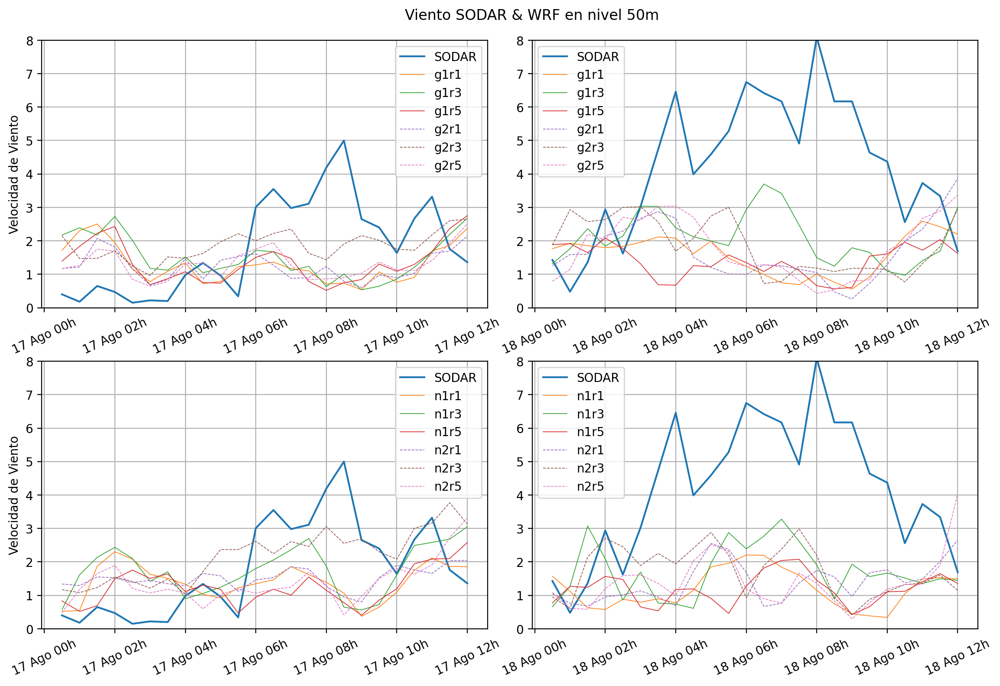

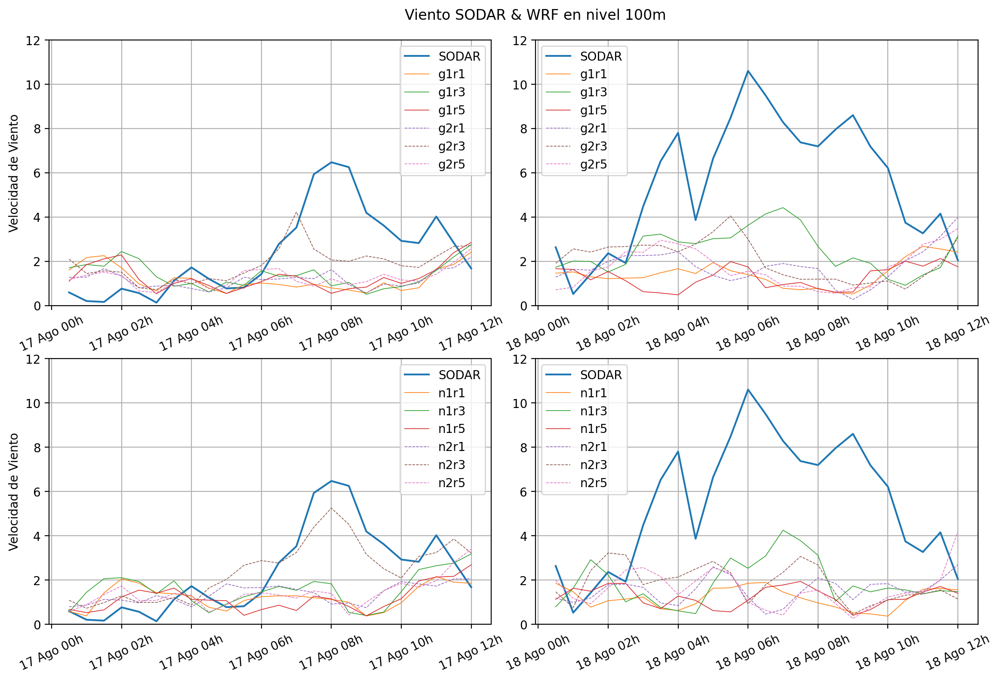

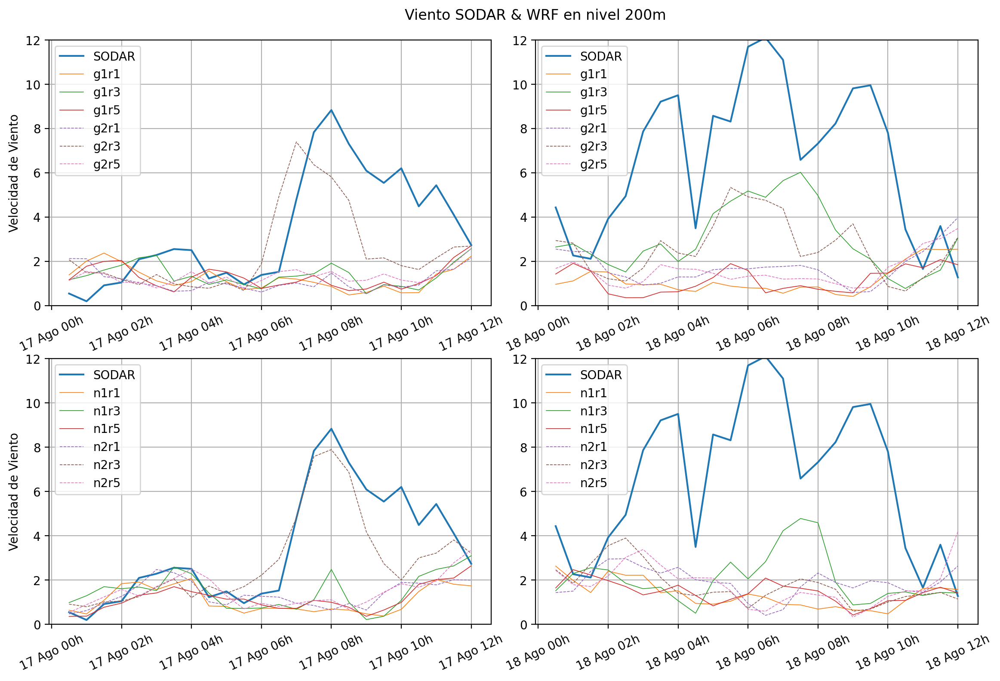

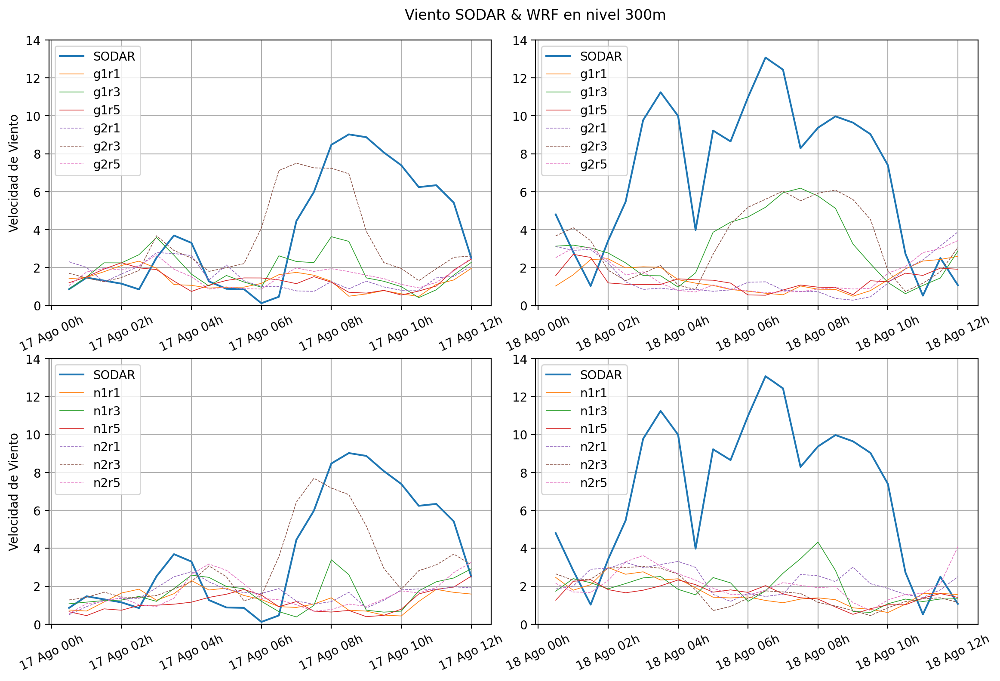

In [13]:
# LLJ

t1, t2, t3, t4 = 24, 48, 72, 96
tt1, tt2 = 0, 8
panelPlot2(2, t1, t2, t3, t4)
tt1, tt2 = 0, 12
panelPlot2(3, t1, t2, t3, t4)
panelPlot2(5, t1, t2, t3, t4)
tt1, tt2 = 0, 14
panelPlot2(7, t1, t2, t3, t4)


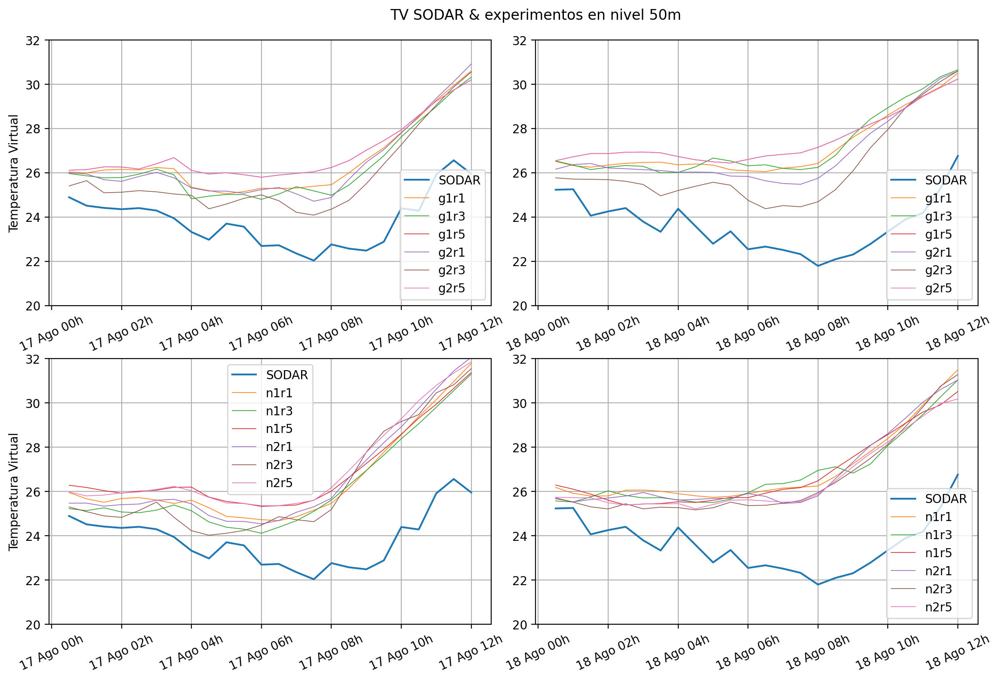

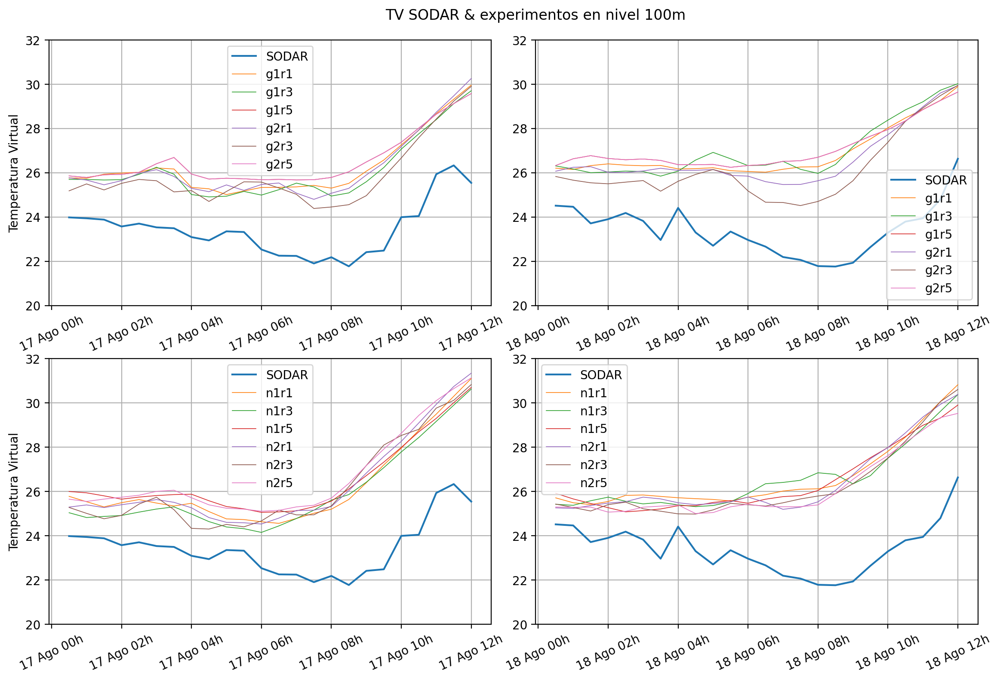

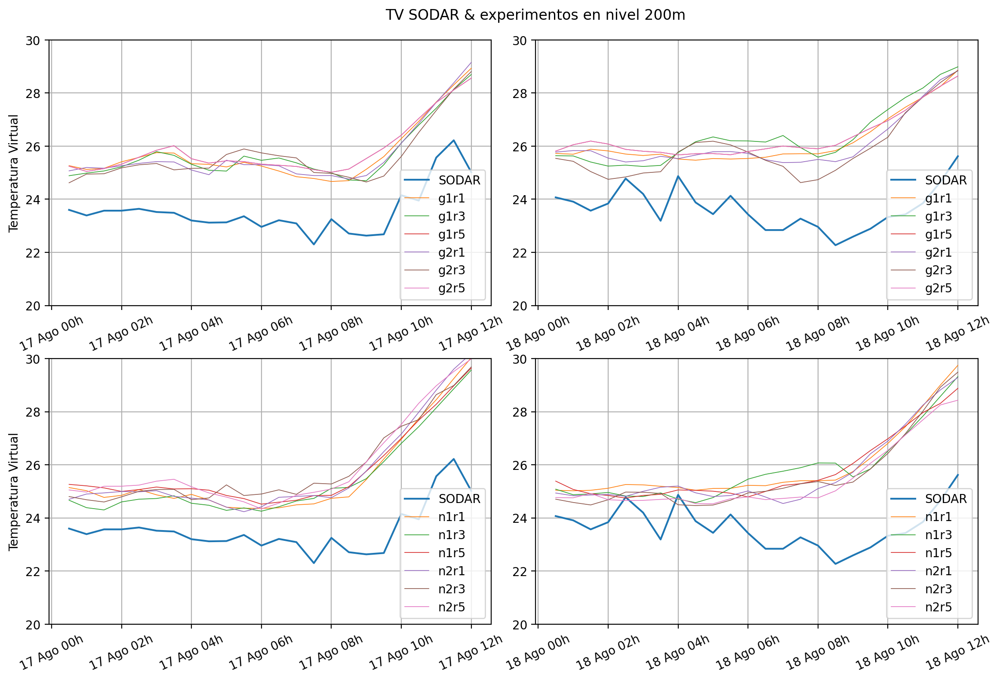

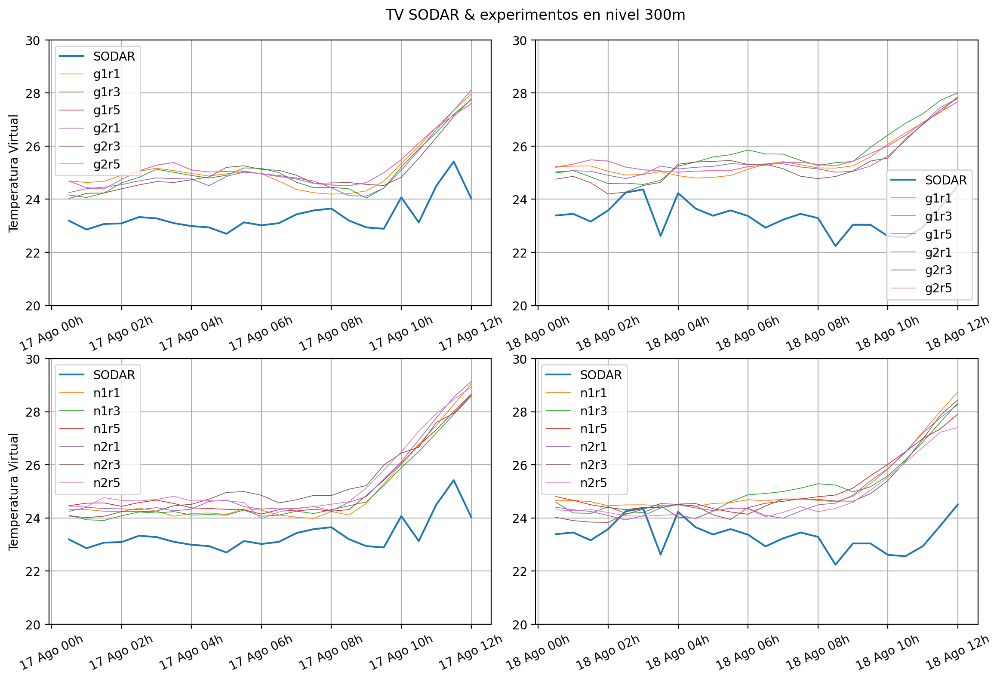

In [14]:
#TV LLJ 

t1, t2, t3, t4 = 24, 48, 72, 96
tt1, tt2 = 20,32
panelPlot2t(2, t1, t2, t3, t4)
panelPlot2t(3, t1, t2, t3, t4)
tt1, tt2 = 20,30
panelPlot2t(5, t1, t2, t3, t4)
panelPlot2t(7, t1, t2, t3, t4)


In [15]:
#t1, t2, t3, t4 = 0, 48, 96, 144
#tt1, tt2 = 20, 35
#panelPlot3t(2, t1, t2, t3, t4)
#panelPlot4(level=3)


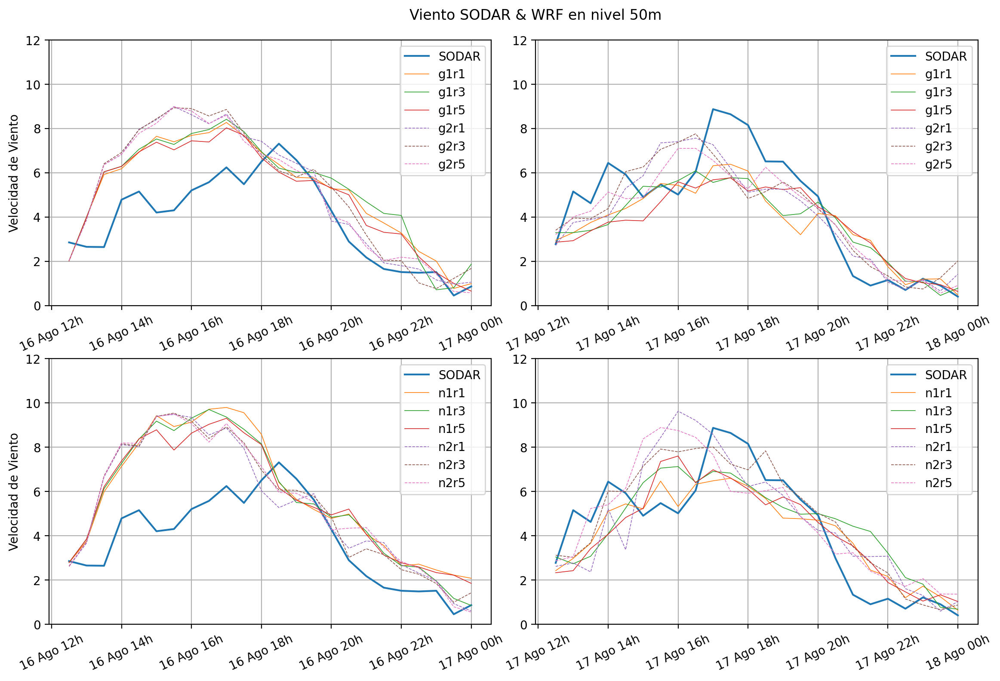

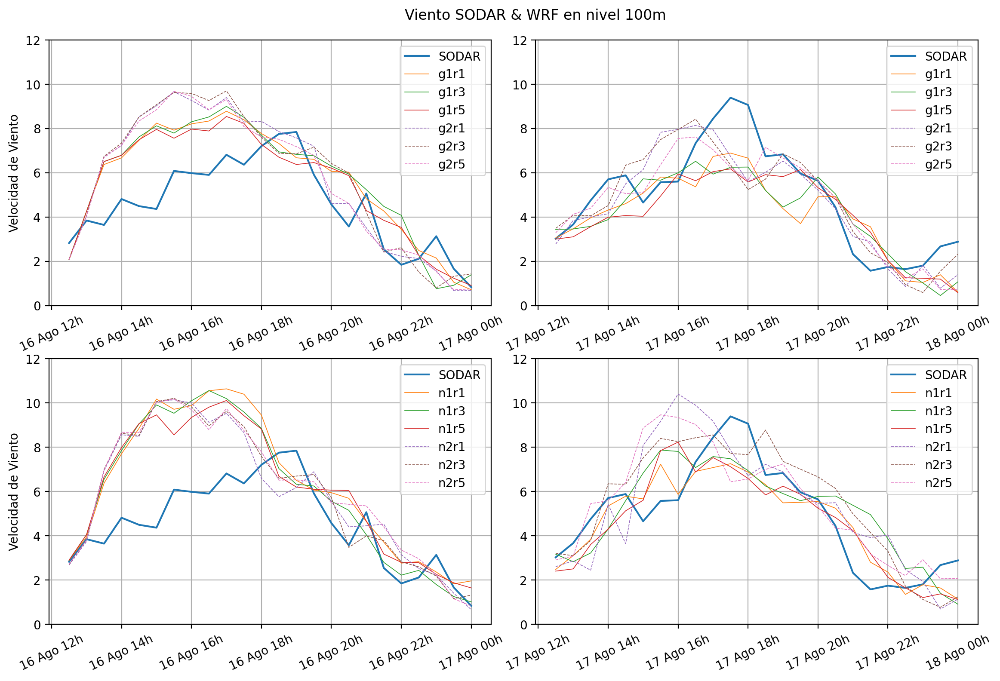

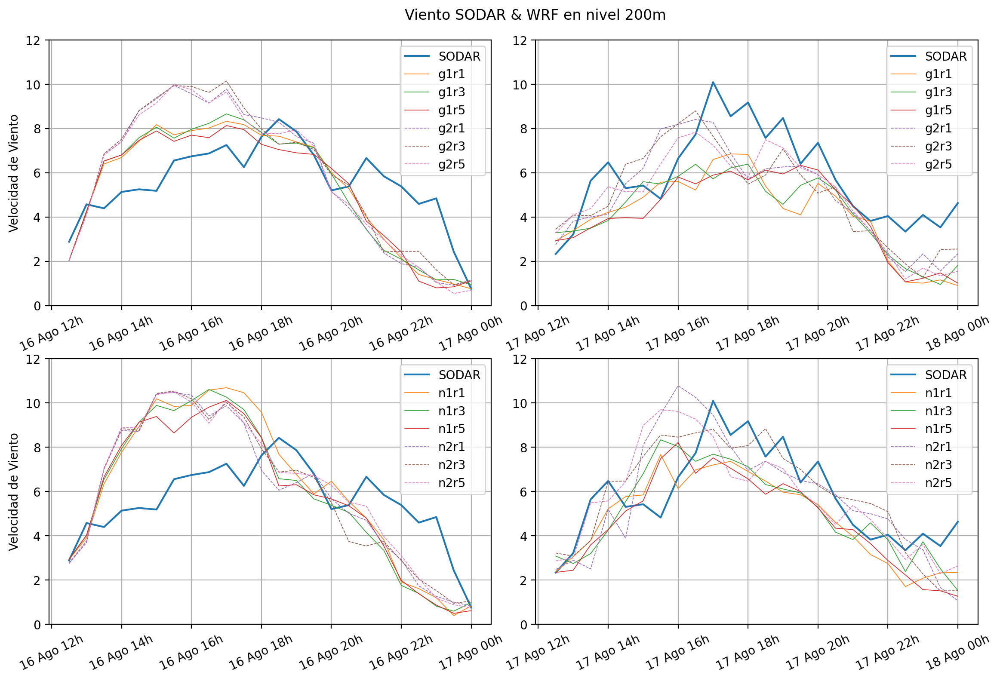

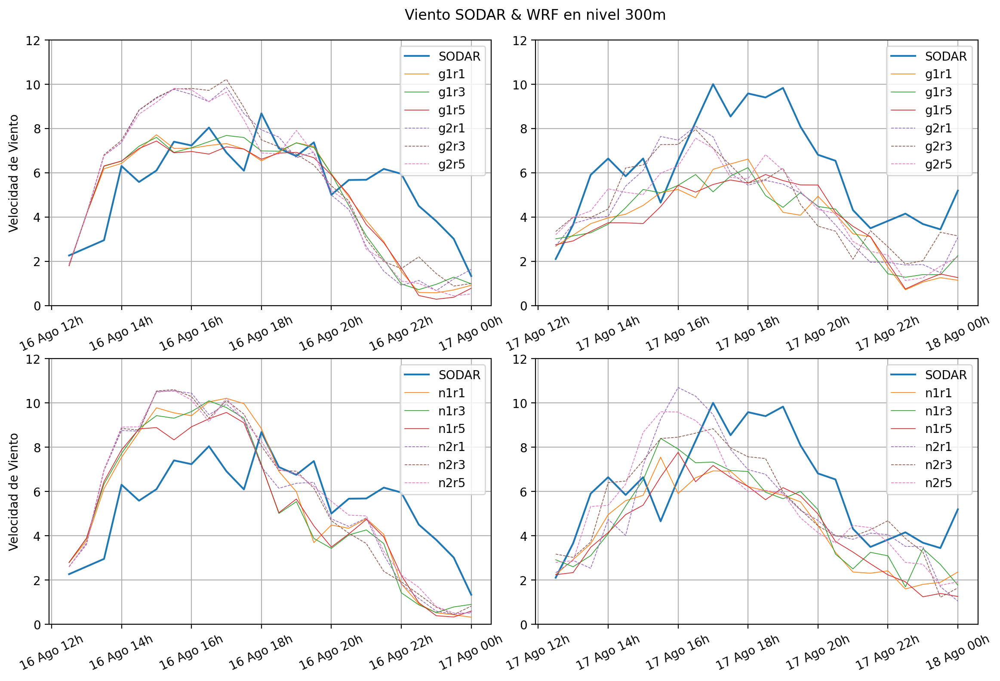

In [16]:
#SB

tt1, tt2 = 0, 12
t1, t2, t3, t4 = 0, 24, 48, 72
panelPlot2(2, t1, t2, t3, t4)
panelPlot2(3, t1, t2, t3, t4)
panelPlot2(5, t1, t2, t3, t4)
panelPlot2(7, t1, t2, t3, t4)



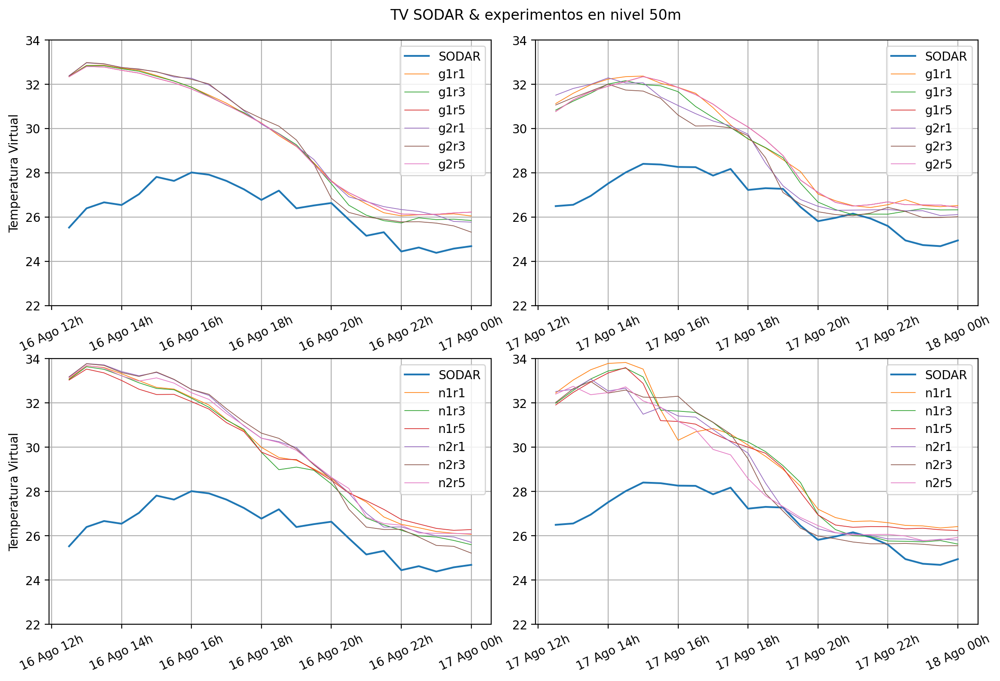

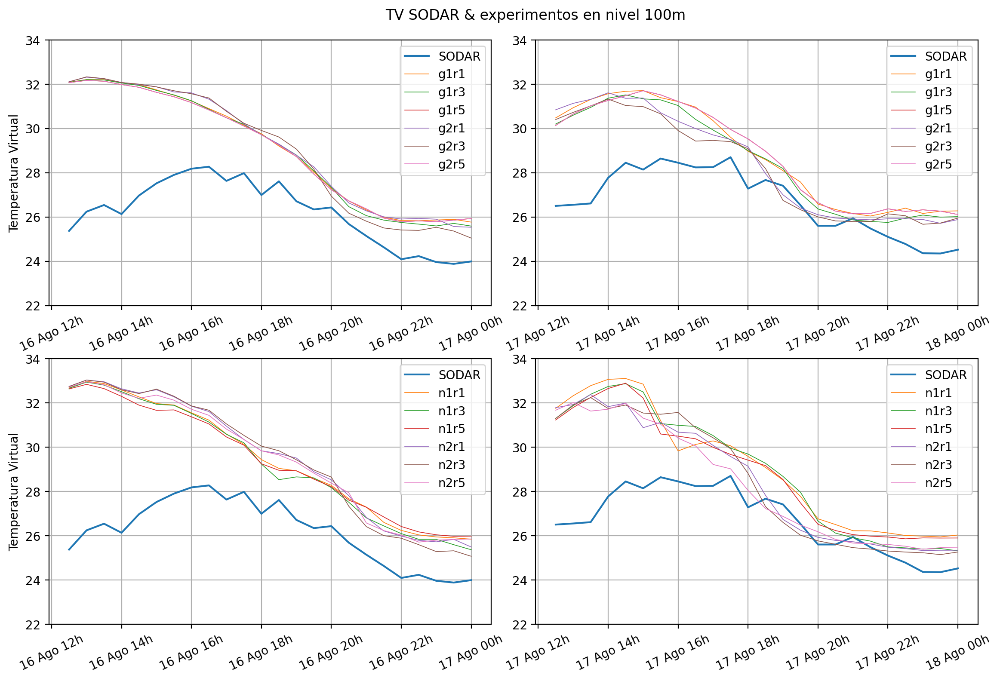

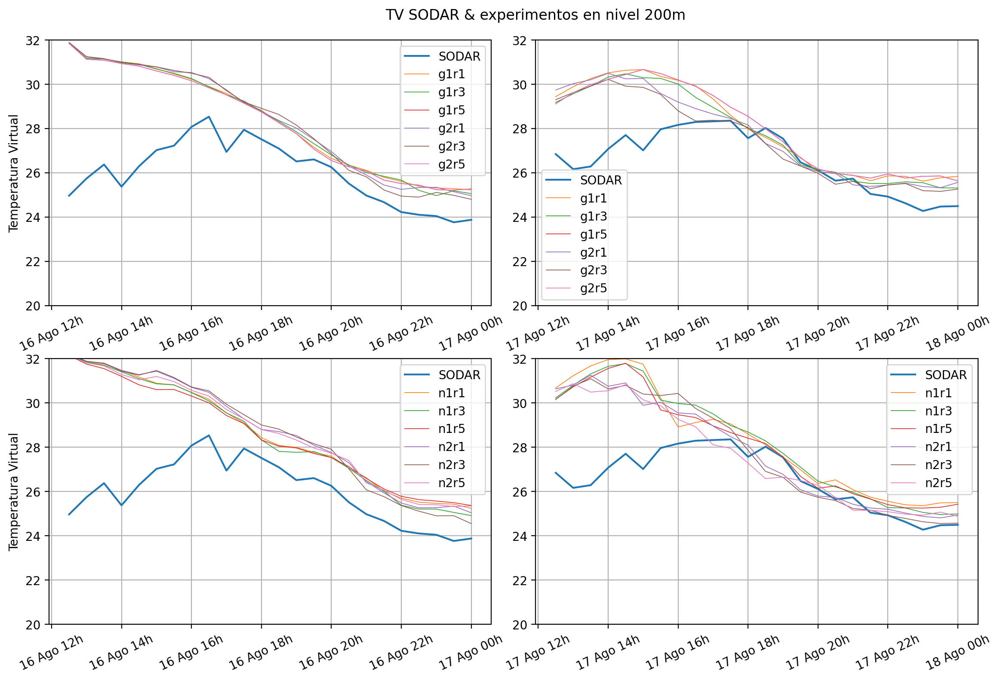

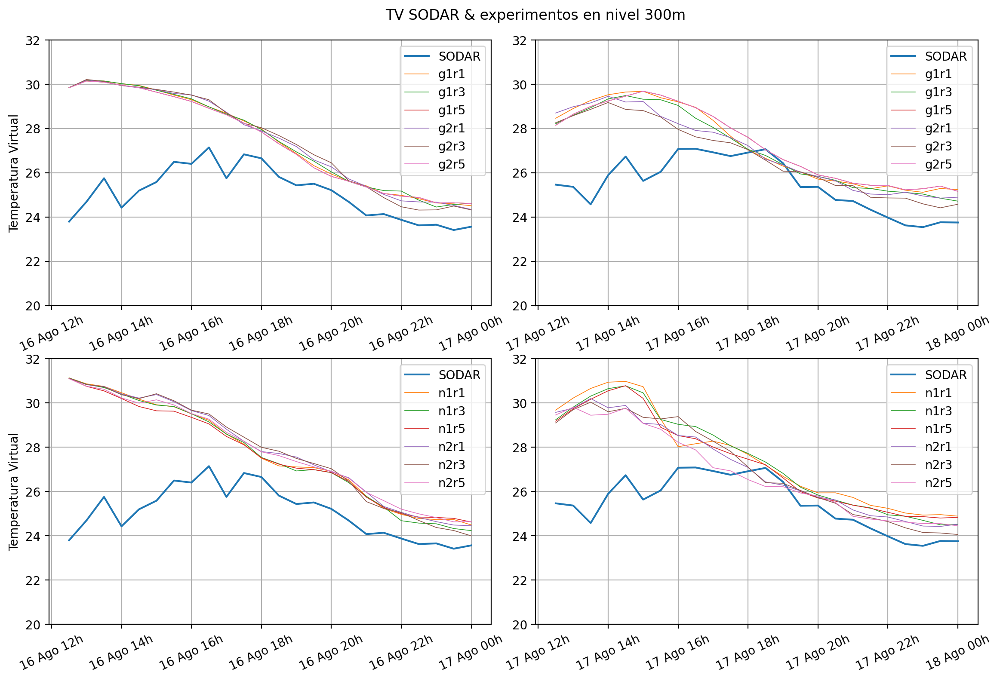

In [17]:
#TV SB

tt1, tt2 = 22, 34
t1, t2, t3, t4 = 0, 24, 48, 72
panelPlot2t(2, t1, t2, t3, t4)
panelPlot2t(3, t1, t2, t3, t4)
tt1, tt2 = 20, 32
panelPlot2t(5, t1, t2, t3, t4)
panelPlot2t(7, t1, t2, t3, t4)
